# Lisence plate object detection

## 1. Importing all libraries, set up agnostic device code and model path

In [ ]:
from datasets import load_dataset
import torch
import torch.nn as nn
import torchvision
import torchvision.transforms as T
from torchvision.models.detection import FasterRCNN, fasterrcnn_resnet50_fpn
from torchvision.models.detection.rpn import AnchorGenerator
from torchvision.models.detection.transform import GeneralizedRCNNTransform
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor, RPNHead
from torch.utils.data import Dataset

import random
from pathlib import Path
from PIL import Image, ImageDraw
from IPython.display import display


from torchmetrics.detection.mean_ap import MeanAveragePrecision
from torchmetrics.classification import BinaryConfusionMatrix
from sklearn.metrics import precision_score, recall_score

# Set up agnostic device code
device = 'cuda' if torch.cuda.is_available else 'cpu'

# Setup model path
MODEL_PATH = Path("models")
MODEL_PATH.mkdir(parents=True, # create parent directories if needed
                 exist_ok=True # if models directory already exists, don't error
)

# Create model save path
MODEL_NAME = "model-with-anchor-nms.pth"
MODEL_SAVE_PATH = MODEL_PATH / MODEL_NAME

In [3]:
class LisencePlateDataset(Dataset):
    def __init__(self, data, transform=None):
        self.transform = transform
        self.data = data

    def __len__(self):
        return len(self.data["image"])

    def __getitem__(self, index):
      image = self.data[index]['image']
      xmin = self.data[index]['objects']["bbox"][0][0]
      ymin = self.data[index]['objects']["bbox"][0][1]
      xmax = xmin + self.data[index]['objects']["bbox"][0][2]
      ymax = ymin + self.data[index]['objects']["bbox"][0][3]
      bbox = [xmin, ymin, xmax, ymax]
      # Access individual elements within the lists in the 'objects' dictionary
      target = {
          "boxes": torch.as_tensor(bbox, dtype=torch.float32).unsqueeze(0),
          "labels": torch.ones(1, dtype=torch.int64), # Labels should be a tensor of integers, one for each box
          "image_id": torch.tensor(self.data[index]['image_id']), # image_id should be a tensor
          "area": torch.as_tensor(self.data[index]['objects']["area"], dtype=torch.float32),
          "iscrowd": torch.zeros(1, dtype=torch.int64), # iscrowd should be a tensor of integers, one for each box
      }

      # Convert the image to a PIL Image before applying transformations

      if self.transform is not None:
          image = self.transform(image)

      return image, target

def collate(batch):
    """return tuple data"""
    return tuple(zip(*batch))



def get_model(num_classes, nms_thresh=0.3, weights=None):
    """
    Faster R-CNN (ResNet50 + FPN) for license plate detection
    with pretrained COCO weights and custom anchors.
    """
    # 1. Load pretrained model on COCO
    model = torchvision.models.detection.fasterrcnn_resnet50_fpn(
        weights=weights
    )

    # 2. Replace the box predictor (for your number of classes)
    in_features = model.roi_heads.box_predictor.cls_score.in_features
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

    # 3. Define custom anchor generator
    # Wide aspect ratios for license plates
    anchor_sizes = ((32,), (64,), (128,), (256,), (512,))
    aspect_ratios = ((0.25, 0.5, 1.0, 2.0, 4.0),) * len(anchor_sizes)

    anchor_generator = AnchorGenerator(
        sizes=anchor_sizes,
        aspect_ratios=aspect_ratios
    )
    model.rpn.anchor_generator = anchor_generator

    # 4. Reinitialize RPN head to match number of anchors
    out_channels = model.backbone.out_channels  # usually 256 for FPN
    num_anchors = len(aspect_ratios[0]) * len(anchor_sizes[0])  # 5 aspect ratios × 1 size = 5
    model.rpn.head = RPNHead(out_channels, num_anchors)

    # 5. Adjust NMS and score thresholds
    model.roi_heads.nms_thresh = nms_thresh
    model.roi_heads.score_thresh = 0.05

    return model

class Averager:
    def __init__(self):
        self.current_total = 0.0
        self.iterations = 0.0

    def send(self, value):
        self.current_total += value
        self.iterations += 1

    @property
    def value(self):
        if self.iterations == 0:
            return 0
        else:
            return 1.0 * self.current_total / self.iterations

    def reset(self):
        self.current_total = 0.0
        self.iterations = 0.0

## 2. Loading dataset, data loader

In [4]:
# Loading the dataset from hugging face
ds = load_dataset("keremberke/license-plate-object-detection", "full")

train_ds = ds['train']
val_ds = ds['validation']
test_ds = ds['test']

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


README.md: 0.00B [00:00, ?B/s]

license-plate-object-detection.py: 0.00B [00:00, ?B/s]

full/train/0000.parquet:   0%|          | 0.00/168M [00:00<?, ?B/s]

full/validation/0000.parquet:   0%|          | 0.00/46.3M [00:00<?, ?B/s]

full/test/0000.parquet:   0%|          | 0.00/22.6M [00:00<?, ?B/s]

Generating train split:   0%|          | 0/6176 [00:00<?, ? examples/s]

Generating validation split:   0%|          | 0/1765 [00:00<?, ? examples/s]

Generating test split:   0%|          | 0/882 [00:00<?, ? examples/s]

training dataset size: 6176
validation dataset size: 1765
tensor([[[0.2588, 0.2588, 0.2588,  ..., 0.1098, 0.1098, 0.1098],
         [0.2588, 0.2588, 0.2588,  ..., 0.1098, 0.1098, 0.1098],
         [0.2588, 0.2588, 0.2588,  ..., 0.1098, 0.1098, 0.1098],
         ...,
         [0.4078, 0.4078, 0.4078,  ..., 0.4235, 0.4235, 0.4235],
         [0.4078, 0.4078, 0.4078,  ..., 0.4235, 0.4235, 0.4235],
         [0.4078, 0.4078, 0.4078,  ..., 0.4235, 0.4235, 0.4235]],

        [[0.1804, 0.1804, 0.1804,  ..., 0.0588, 0.0588, 0.0588],
         [0.1804, 0.1804, 0.1804,  ..., 0.0588, 0.0588, 0.0588],
         [0.1804, 0.1804, 0.1804,  ..., 0.0588, 0.0588, 0.0588],
         ...,
         [0.3020, 0.3020, 0.3020,  ..., 0.3412, 0.3412, 0.3412],
         [0.3020, 0.3020, 0.3020,  ..., 0.3412, 0.3412, 0.3412],
         [0.3020, 0.3020, 0.3020,  ..., 0.3412, 0.3412, 0.3412]],

        [[0.1765, 0.1765, 0.1765,  ..., 0.0000, 0.0000, 0.0000],
         [0.1765, 0.1765, 0.1765,  ..., 0.0000, 0.0000, 0.0000],


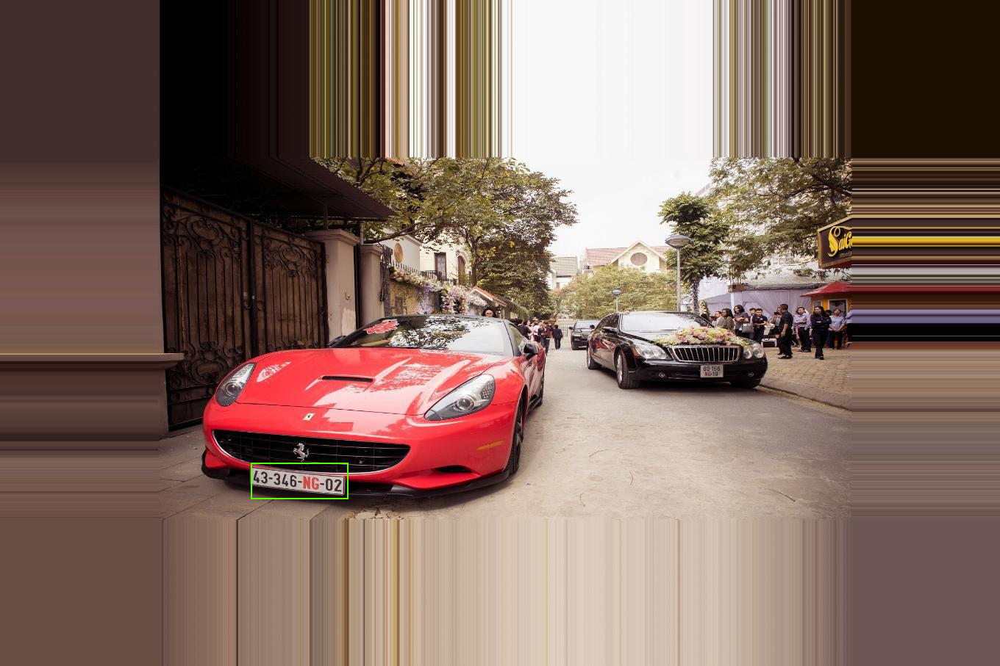

In [ ]:
transform = T.Compose

# create dataset
training_dataset = LisencePlateDataset(
    data=train_ds,
    transform = T.ToTensor()
)
validation_dataset = LisencePlateDataset(
    data = val_ds,
    transform = T.ToTensor()
)

testing_dataset = LisencePlateDataset(
    data=test_ds,
    transform = T.ToTensor()
    )

print(f"training dataset size: {training_dataset.__len__()}")
print(f"validation dataset size: {validation_dataset.__len__()}")

# get a random training sample
# Corrected: Use square brackets to access dataset items by index
img, label = training_dataset[int(random.randint(0, len(training_dataset) - 1))]
print(img)
print(f"random training label: {label}")

# display image with bbox label
transform_tensor_to_img = T.ToPILImage()
img = transform_tensor_to_img(img)
# Ensure bbox coordinates are in the correct format (x1, y1, x2, y2)
x1, y1, x2, y2 = label["boxes"].numpy()[0]
draw = ImageDraw.Draw(img)
draw.rectangle([x1, y1, x2, y2], fill=None, outline="#55ff00", width=2)
display(img)

In [6]:
BATCH_SIZE = 4
train_loader = torch.utils.data.DataLoader(
    training_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=0,
    collate_fn=collate,
)

validation_loader = torch.utils.data.DataLoader(
    validation_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=0,
    collate_fn=collate,
)

test_loader = torch.utils.data.DataLoader(
    testing_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=0,
    collate_fn=collate,
)

## 3. Trainning...

#### We'll be using the model with the pretrained weight of frcnn_resnet50_fpn on the COCO dataset

In [ ]:
# Initialize model:
num_classes = 2  # background + license_plate
weights = "COCO_V1"
model = get_model(num_classes=num_classes, nms_thresh=0.3, weights = weights)

if device == 'cuda':
  model.to(device)

Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth


100%|██████████| 160M/160M [00:01<00:00, 154MB/s]


In [ ]:
params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(model.parameters(), lr=0.005, momentum=0.9, weight_decay=0.0005)
lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=3, gamma=0.1)

#### The Average calculate the loss per batch which is the sum of `{'loss_classifier', 'loss_box_reg', 'loss_objectness', 'loss_rpn_box_reg'} `

In [ ]:
train_losses = Averager()
val_losses = Averager()
lowest_val_loss = float('inf')
NUM_EPOCHS = 6

# has to be in train mode for both train and valid coz the outputs are different in two cases
model.train()
for epoch in range(NUM_EPOCHS):
    train_losses.reset()
    val_losses.reset()

    for batch_index, (images, targets) in enumerate(train_loader):
        # move the images and targets to device
        images = list(image.to(device) for image in images)
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

        loss_dict = model(images,targets)
        loss = sum(loss for loss in loss_dict.values())

        # track the loss
        train_losses.send(loss.item())

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        if batch_index % 500 == 0:
            print(f"Epoch: {epoch} Batch Index: {batch_index} Loss: {loss.item()}")

    # evaluate
    with torch.no_grad():
        for _, (images, targets) in enumerate(validation_loader):
            # move the images and targets to device
            images = list(image.to(device) for image in images)
            targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

            val_loss_dict = model(images, targets)
            val_loss = sum(loss for loss in val_loss_dict.values())

            # track the loss
            val_losses.send(val_loss.item())

    if val_losses.value < lowest_val_loss:
        torch.save(model.state_dict(), MODEL_SAVE_PATH)
    else:
        if lr_scheduler is not None:
            lr_scheduler.step()

    # print stats
    print(f"Epoch #{epoch} TRAIN LOSS: {train_losses.value} VALIDATION LOSS: {val_losses.value}\n")

## 4. Evaluation

### 4.1 Loading model

In [8]:
model = get_model(num_classes = 2)

model.load_state_dict(torch.load(MODEL_SAVE_PATH))
model.to(device)
model.eval()

Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth


100%|██████████| 97.8M/97.8M [00:00<00:00, 161MB/s]


FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=1e-05)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=1e-05)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=1e-05)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=1e-05)
          (relu

### 4.2 Evaluation using the average loss `{'loss_classifier', 'loss_box_reg', 'loss_objectness', 'loss_rpn_box_reg'} ` of batch () and metric mAP

In [ ]:
model.train()

test_loss = 0.0
num_batches = 0

with torch.no_grad():  # disable backprop but still allow loss computation
    for images, targets in test_loader:
        images = [img.to(device) for img in images]
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

        # forward pass with targets gives loss dict
        loss_dict = model(images, targets)
        losses = sum(loss for loss in loss_dict.values())


        test_loss += losses.item()
        num_batches += 1
        if num_batches % 50 == 0:
          print("Loss dict:", {k: v.item() for k, v in loss_dict.items()}, "of batch: ", num_batches)

avg_test_loss = test_loss / num_batches
print(f"\nAverage test loss of batch: {avg_test_loss:.4f}")

Loss dict: {'loss_classifier': 0.01212099939584732, 'loss_box_reg': 0.04956270754337311, 'loss_objectness': 0.0004908522823825479, 'loss_rpn_box_reg': 0.0012724759289994836} of batch:  50
Loss dict: {'loss_classifier': 0.0152768949046731, 'loss_box_reg': 0.03934004157781601, 'loss_objectness': 0.00031542504439130425, 'loss_rpn_box_reg': 0.0006090478273108602} of batch:  100
Loss dict: {'loss_classifier': 0.03111574426293373, 'loss_box_reg': 0.03336207568645477, 'loss_objectness': 0.015115929767489433, 'loss_rpn_box_reg': 0.0018841975834220648} of batch:  150
Loss dict: {'loss_classifier': 0.01034841313958168, 'loss_box_reg': 0.03652695566415787, 'loss_objectness': 0.00032148108584806323, 'loss_rpn_box_reg': 0.000659481156617403} of batch:  200

Average test loss of batch: 0.0617


In [10]:
model.to(device)
model.eval()

# metric objects
map_metric = MeanAveragePrecision()

all_preds = []
all_targets = []

with torch.no_grad():
    for images, targets in test_loader:
        images = [img.to(device) for img in images]
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

        # predictions on GPU
        predictions = model(images)

        # move preds + targets to CPU for torchmetrics
        preds_cpu = [{k: v.cpu() for k, v in p.items()} for p in predictions]
        targets_cpu = [{k: v.cpu() for k, v in t.items()} for t in targets]

        # update mAP metric
        map_metric.update(preds_cpu, targets_cpu)

        # collect labels for confusion matrix
        for pred, tgt in zip(preds_cpu, targets_cpu):
            all_preds.extend(pred["labels"].numpy())
            all_targets.extend(tgt["labels"].numpy())

# compute mAP
map_results = map_metric.compute()
print("\nMean Average Precision (mAP):")
print(map_results)


Mean Average Precision (mAP):
{'map': tensor(0.6848), 'map_50': tensor(0.9798), 'map_75': tensor(0.8414), 'map_small': tensor(0.5641), 'map_medium': tensor(0.7065), 'map_large': tensor(0.7090), 'mar_1': tensor(0.7263), 'mar_10': tensor(0.7296), 'mar_100': tensor(0.7296), 'mar_small': tensor(0.6182), 'mar_medium': tensor(0.7506), 'mar_large': tensor(0.7409), 'map_per_class': tensor(-1.), 'mar_100_per_class': tensor(-1.), 'classes': tensor(1, dtype=torch.int32)}


### 4.3 Visualizing the ground truth and predicted bounding boxes

In [11]:
# Reducing the threshold so the model return output for the low confident ones
model.roi_heads.score_thresh = 0.001
model.roi_heads.nms_thresh = 0.5

def inference(image, target, device, model):
  model.eval()
  with torch.no_grad():
      pred = model([image.to(device)])

  # display image with bbox
  transform = T.ToPILImage()
  image = transform(image)
  x1, y1, x2, y2 = pred[0]["boxes"].cpu().detach().numpy()[0]
  gtx1, gty1, gtx2, gty2 = target["boxes"].cpu().detach().numpy()[0]
  draw = ImageDraw.Draw(image)
  draw.rectangle([x1, y1, x2, y2], fill=None, outline="#ff0000cc", width=2)
  draw.rectangle([gtx1, gty1, gtx2, gty2], fill=None, outline="#55ff00", width=2)
  display(image)

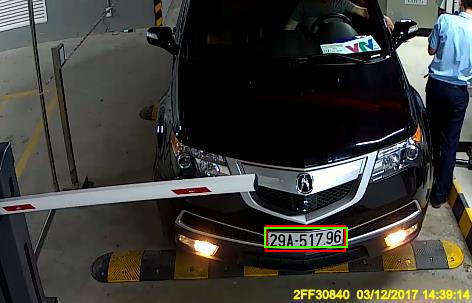

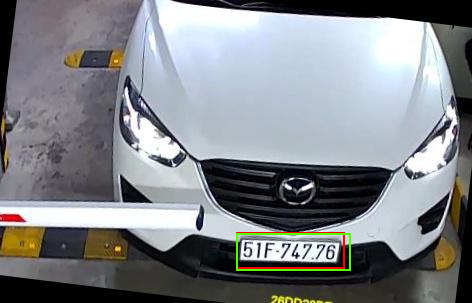

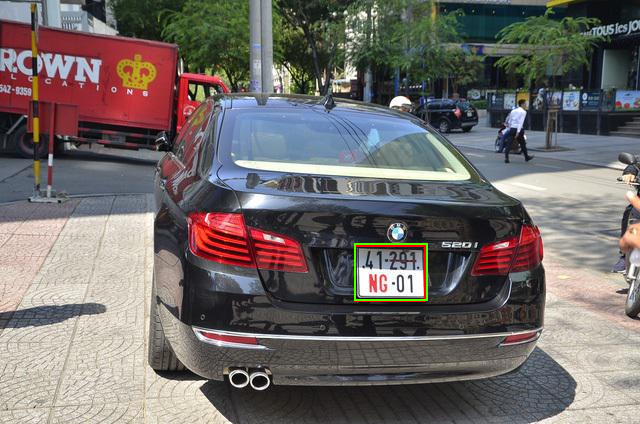

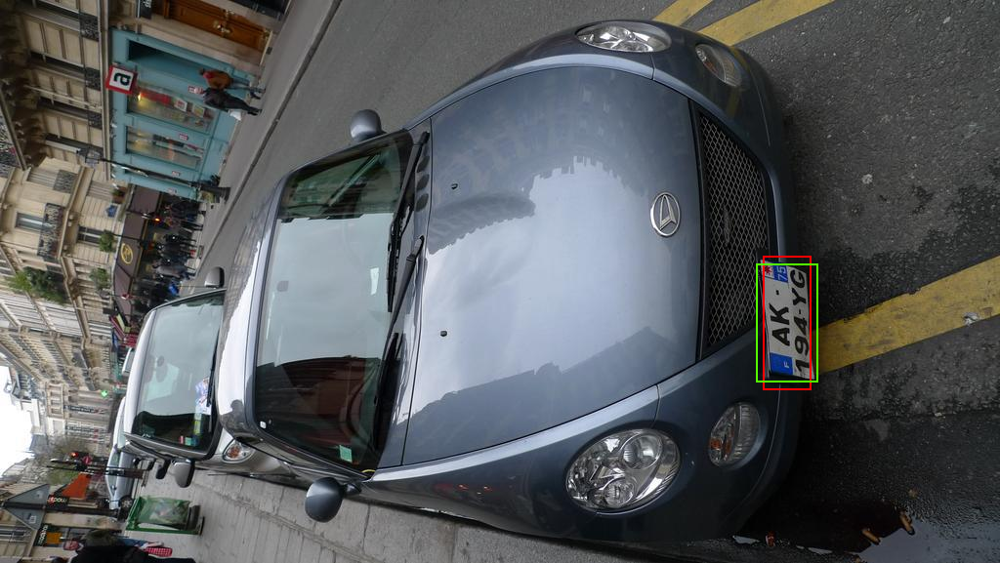

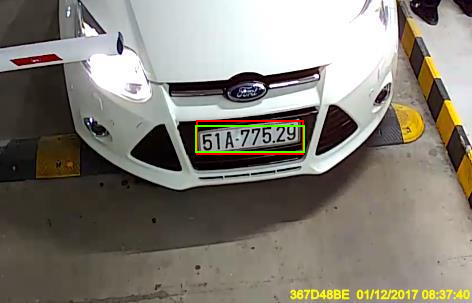

...

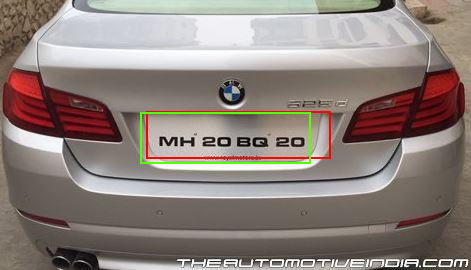

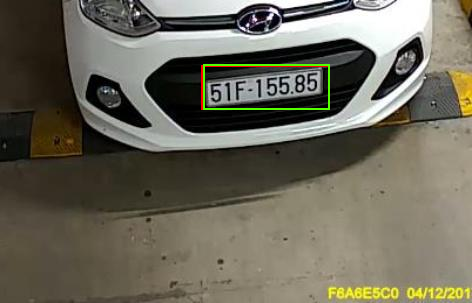

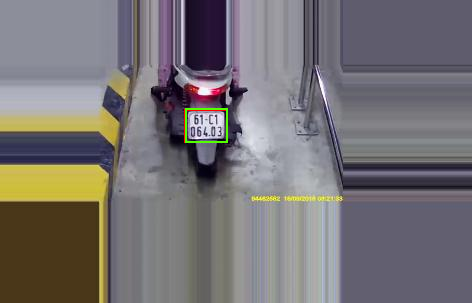

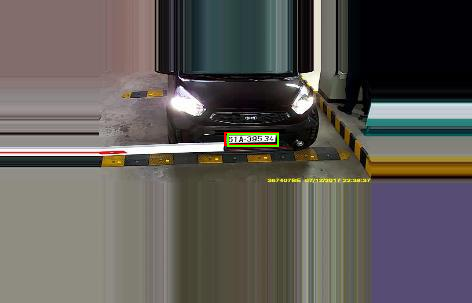

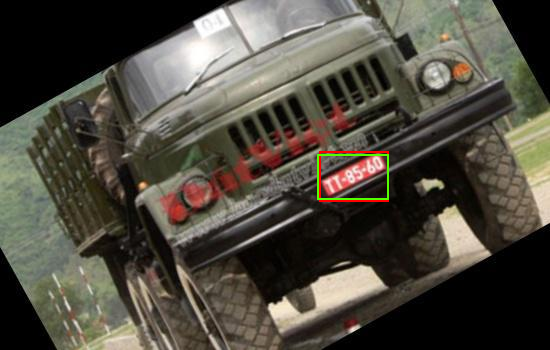

In [12]:
for i in range(0, 50):
    image, target = testing_dataset[i]
    inference(image, target, device, model)